# Finding RNAfish spots in 256x256 images using Unet, Conv2d

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from scipy.optimize import curve_fit
from PIL import Image
import random
import utils

In [2]:
data='/home/ubuntu/Data/'

# Get data

Load data from file

In [52]:
DIM=128
shp=[1,DIM,DIM,1]

In [53]:
both=utils.get_raw_float_image(data+'AutoEncoder128.raw',shp)




In [54]:
train_data=both/334328.0
train_data=np.reshape(train_data, [-1, DIM, DIM, 1])

mean=np.mean(train_data)
std=np.std(train_data)


train_data=(train_data-mean)/(std*1)+0.5


validation=train_data

In [55]:
print([mean, std])

[0.7124672, 0.0698921]


In [56]:
[np.max(train_data[0,:,:,0]), np.min(train_data[0,:,:,0])]

[2.2181723, -3.3558083]

In [57]:
np.std(train_data[0,:,:,0])

0.6030736

# Design network

Define a function to create a convolutional layer, including conv, relu, maxpool, that can be called multiple times

In [68]:
tf.reset_default_graph()
#Input and output
x=tf.placeholder(dtype=tf.float32, shape=[None, DIM,DIM,1], name='x')
y=tf.placeholder(dtype=tf.float32, shape=[None, DIM,DIM,1], name='y')
lr=tf.placeholder(dtype=tf.float32, shape=[], name='learning_rate')
dr=tf.placeholder(dtype=tf.float32, shape=[], name='dropout_rate')

regularizer = tf.contrib.layers.l2_regularizer(scale=0.1)

xr=x
yr=y

base_scaler=32

#Going down
A1=utils.leaky_relu(tf.layers.conv2d(xr, base_scaler, [5,5], padding='SAME', kernel_regularizer=regularizer))
A2=utils.leaky_relu(tf.layers.conv2d(A1, base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

B0=tf.nn.max_pool(A2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
B1=utils.leaky_relu(tf.layers.conv2d(B0, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
B2=utils.leaky_relu(tf.layers.conv2d(B1, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

C0=tf.nn.max_pool(B2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
C1=utils.leaky_relu(tf.layers.conv2d(C0, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
C2=utils.leaky_relu(tf.layers.conv2d(C1, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

D0=tf.nn.max_pool(C2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
D1=utils.leaky_relu(tf.layers.conv2d(D0, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
D2=utils.leaky_relu(tf.layers.conv2d(D1, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

E0=tf.nn.max_pool(D2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
E1=utils.leaky_relu(tf.layers.conv2d(E0, 16*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
E2=utils.leaky_relu(tf.layers.conv2d(E1, 16*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

F0=tf.nn.max_pool(E2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
F1=utils.leaky_relu(tf.layers.conv2d(F0, 32*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
F2=utils.leaky_relu(tf.layers.conv2d(F1, 32*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

#Dense
dim=int(DIM/32)
Flat=tf.reshape(F2, [-1, dim*dim*32*base_scaler])
Dense=tf.layers.dense(Flat, 256)
FlatDense=tf.layers.dense(Dense, dim*dim*32*base_scaler)
FF0=tf.reshape(FlatDense, [-1, dim, dim, 32*base_scaler])

print(F1.get_shape())
print(Flat.get_shape())
print(Dense.get_shape())
print(FlatDense.get_shape())
print(FF0.get_shape())


#Coming up
EE0=tf.layers.conv2d_transpose(FF0, 16*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
EE1=utils.leaky_relu(tf.layers.conv2d(EE0, 16*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
EE2=utils.leaky_relu(tf.layers.conv2d(EE1, 16*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

DD0=tf.layers.conv2d_transpose(EE2, 8*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
#DD1=tf.concat(axis=3, values=[DD0,D2])
DD2=utils.leaky_relu(tf.layers.conv2d(DD0, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
DD3=utils.leaky_relu(tf.layers.conv2d(DD2, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

CC0=tf.layers.conv2d_transpose(DD3, 4*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
#CC1=tf.concat(axis=3, values=[CC0,C2])
CC2=utils.leaky_relu(tf.layers.conv2d(CC0, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
CC3=utils.leaky_relu(tf.layers.conv2d(CC2, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

BB0=tf.layers.conv2d_transpose(CC3, 2*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
#BB1=tf.concat(axis=3, values=[BB0,B2])
BB2=utils.leaky_relu(tf.layers.conv2d(BB0, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
BB3=utils.leaky_relu(tf.layers.conv2d(BB2, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

AA0=tf.layers.conv2d_transpose(BB3, base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
#AA1=tf.concat(axis=3, values=[AA0,A2])
AA2=utils.leaky_relu(tf.layers.conv2d(AA0, base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
AA3=utils.leaky_relu(tf.layers.conv2d(AA2, base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

logits=(tf.layers.conv2d(AA3, 1, [1,1], padding='SAME', kernel_regularizer=regularizer))
#probs=tf.tanh(logits, name='probabilities')
probs=logits

diff=tf.subtract(probs, yr)
LSQ=tf.multiply(diff,diff)
#Added this to make the outlines more potent in error function
#OutError, MaskError=tf.split(LSQ, [1,1], 3)
#loss=1*tf.reduce_mean(OutError)+0.1*tf.reduce_mean(MaskError)
loss=tf.reduce_mean(LSQ, name='error')
l2_loss = tf.losses.get_regularization_loss()
#loss=loss+l2_loss/1000

train_op=tf.train.AdamOptimizer(learning_rate=lr, name='trainer').minimize(loss)

tf.summary.scalar('loss', loss)
tf.summary.image('input', x, 4)
tf.summary.image('standard', y, 4)
tf.summary.image('processed', probs, 4)


merge = tf.summary.merge_all()

(?, 4, 4, 1024)
(?, 16384)
(?, 256)
(?, 16384)
(?, 4, 4, 1024)


# Training on easy set

0
Training loss:  1.0491556
(4, 128, 128, 1)
Validation loss:  0.47872525


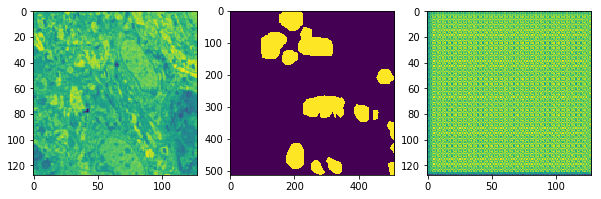

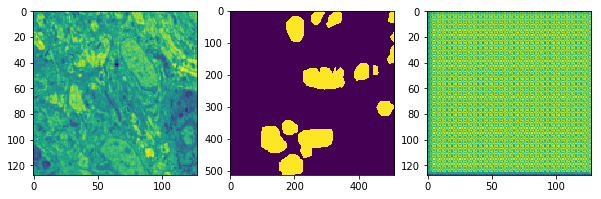

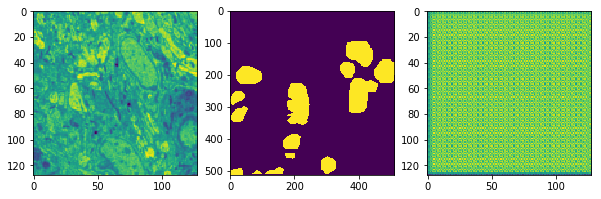

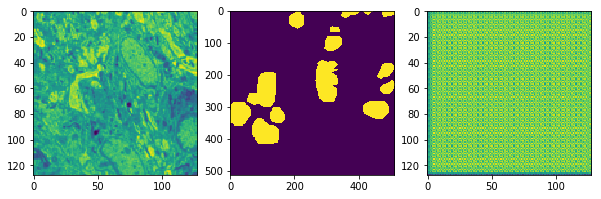

100
Training loss:  0.69532454
(4, 128, 128, 1)
Validation loss:  0.3410951


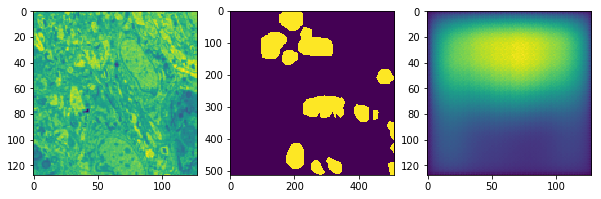

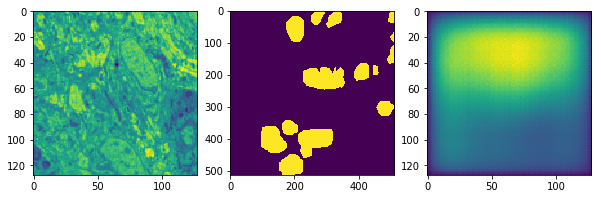

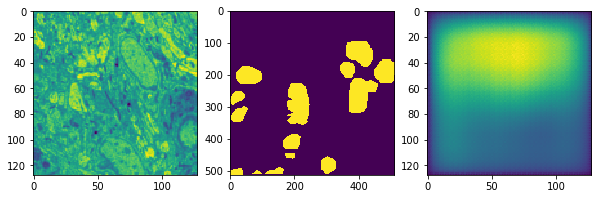

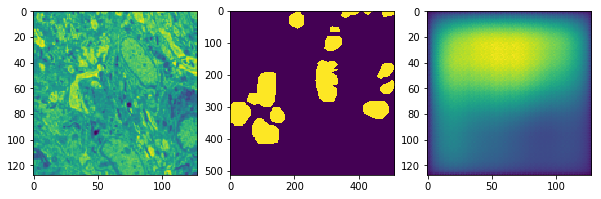

200
Training loss:  0.6960978
(4, 128, 128, 1)
Validation loss:  0.31620452


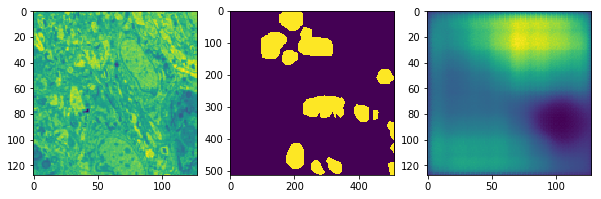

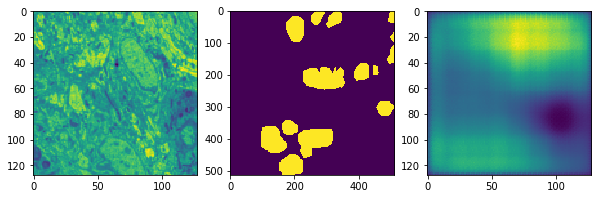

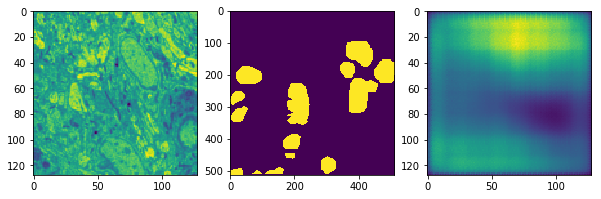

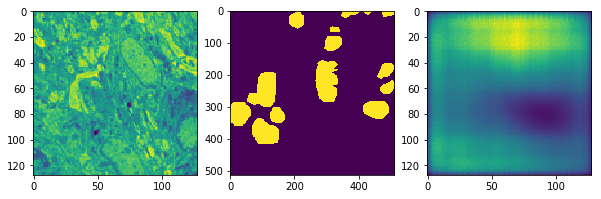

300
Training loss:  0.559478
(4, 128, 128, 1)
Validation loss:  0.306701


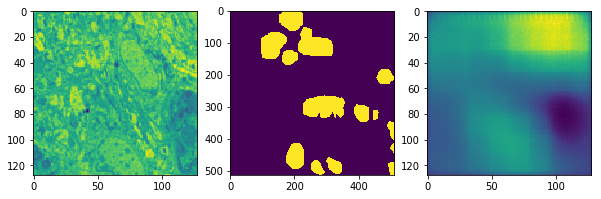

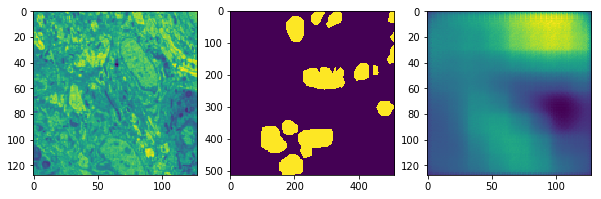

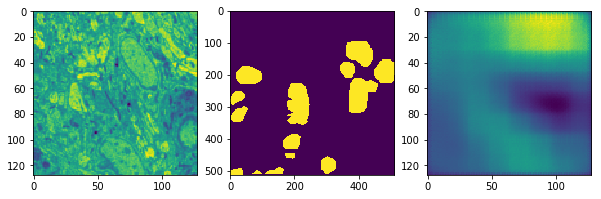

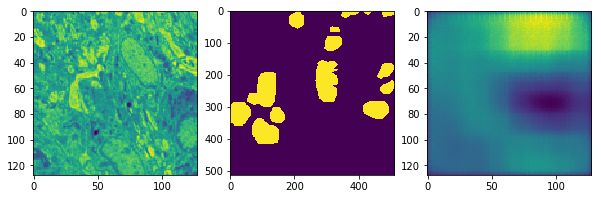

400
Training loss:  0.50566614
(4, 128, 128, 1)
Validation loss:  0.2948967


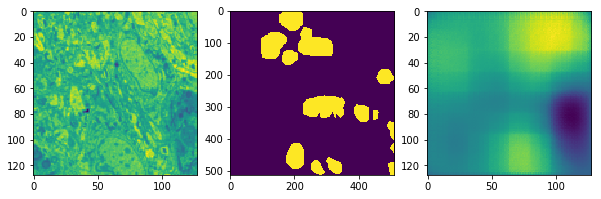

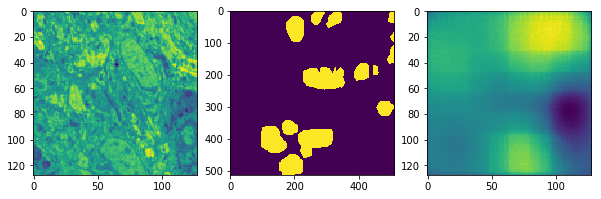

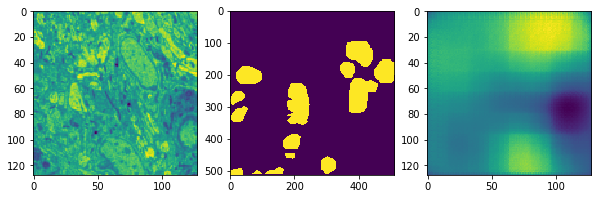

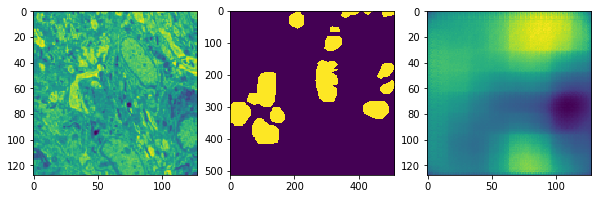

500
Training loss:  0.54591745
(4, 128, 128, 1)
Validation loss:  0.28844178


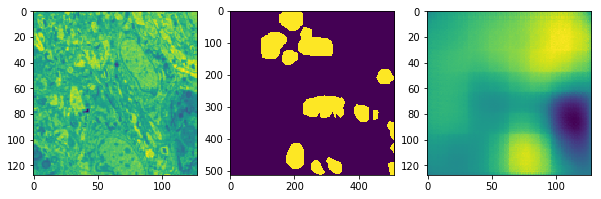

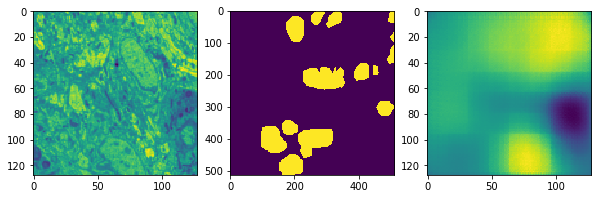

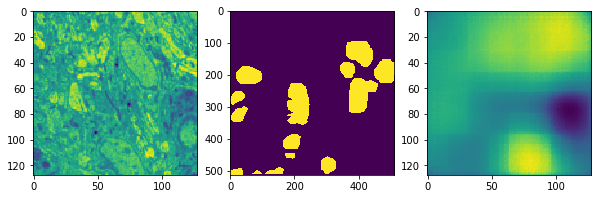

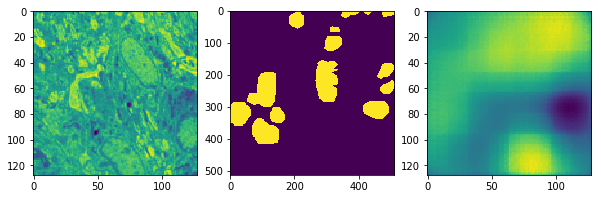

600
Training loss:  0.52859133
(4, 128, 128, 1)
Validation loss:  0.28879955


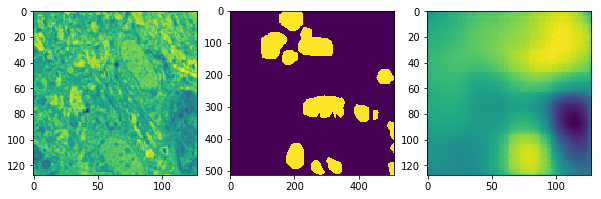

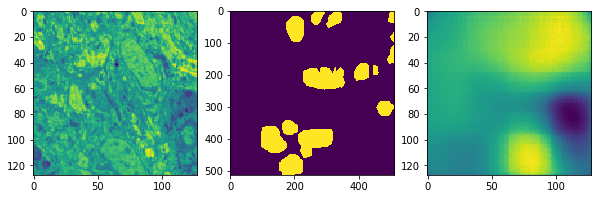

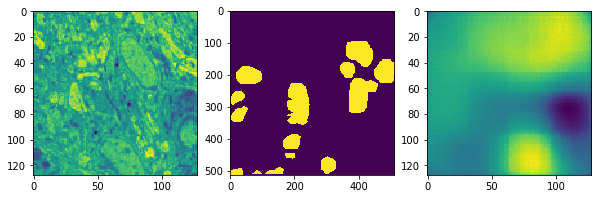

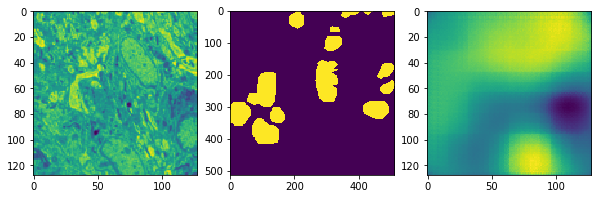

700
Training loss:  0.50277627
(4, 128, 128, 1)
Validation loss:  0.28697005


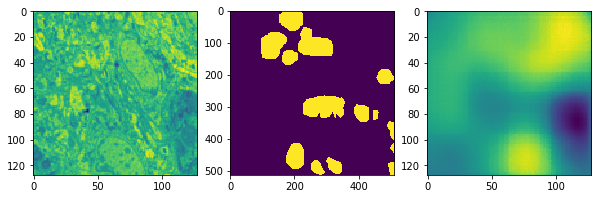

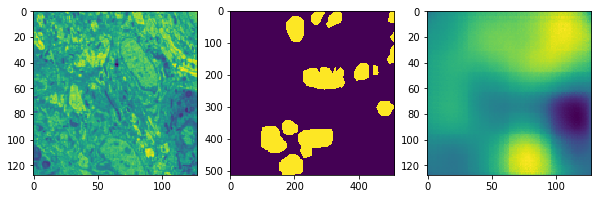

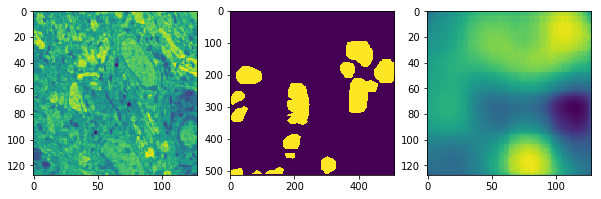

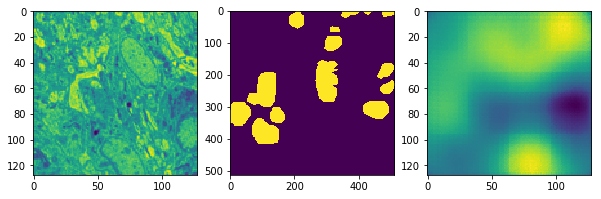

800
Training loss:  0.4961011
(4, 128, 128, 1)
Validation loss:  0.28523052


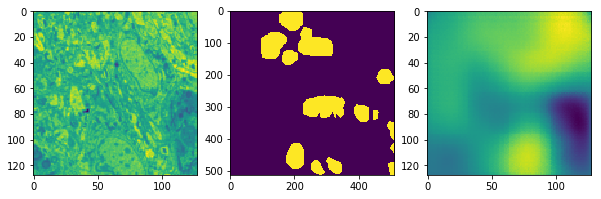

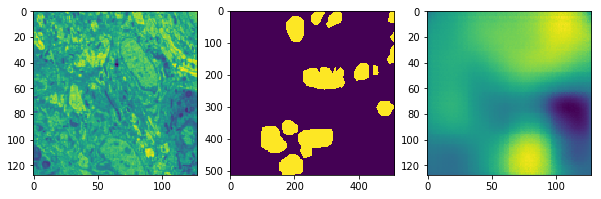

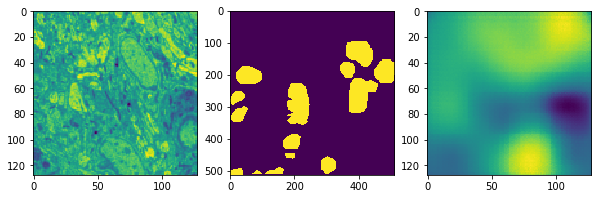

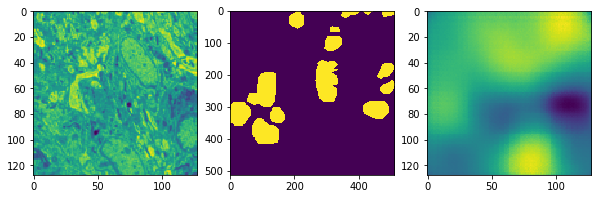

900
Training loss:  0.47743455
(4, 128, 128, 1)
Validation loss:  0.27483073


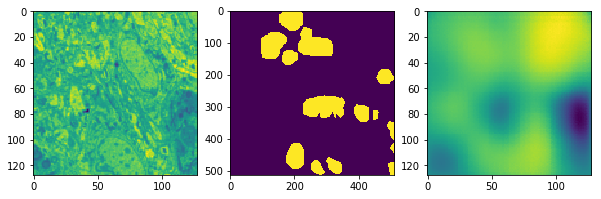

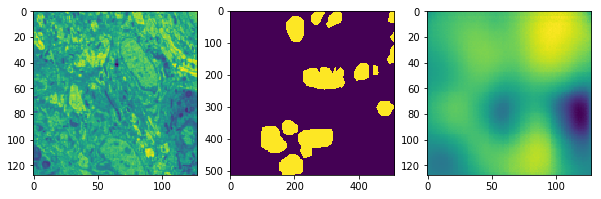

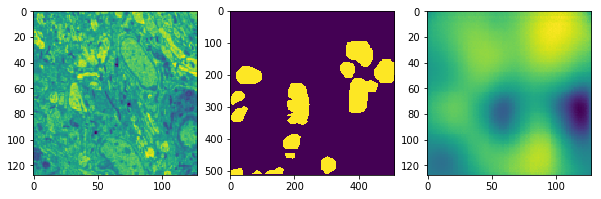

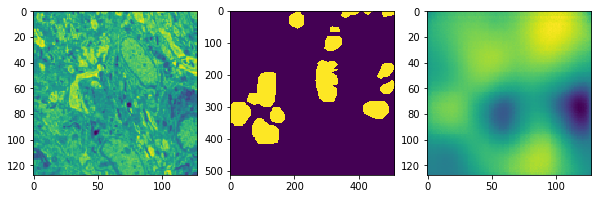

1000
Training loss:  0.50165343
(4, 128, 128, 1)
Validation loss:  0.27823368


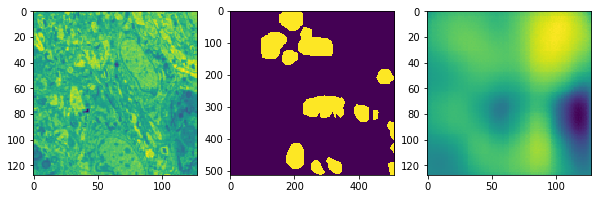

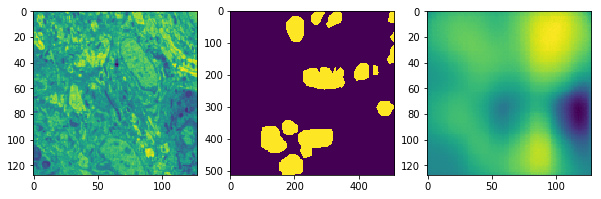

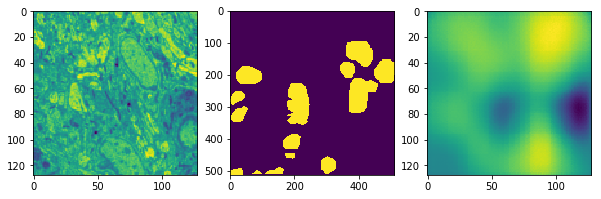

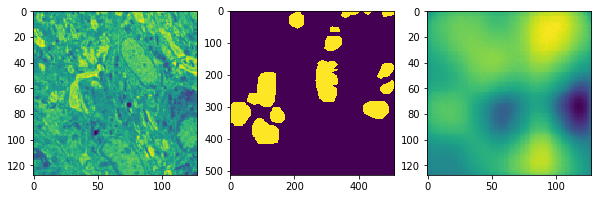

1100
Training loss:  0.47559395
(4, 128, 128, 1)
Validation loss:  0.27531362


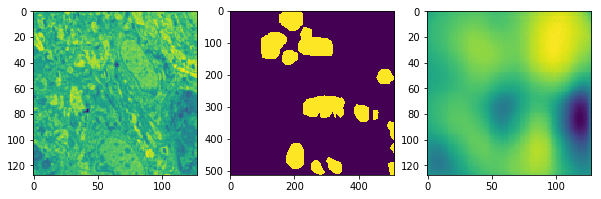

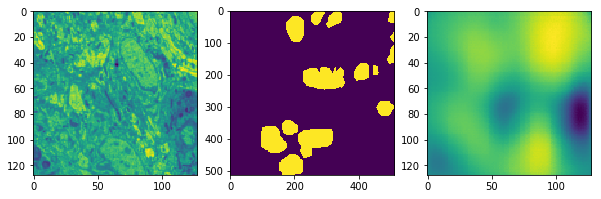

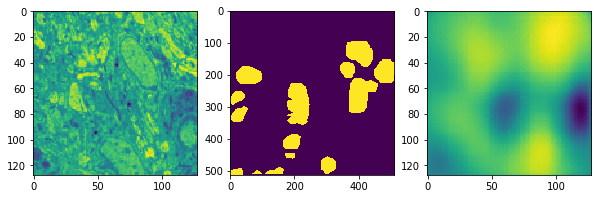

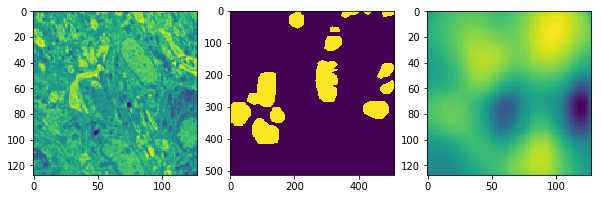

1200
Training loss:  0.4707755
(4, 128, 128, 1)
Validation loss:  0.27628678


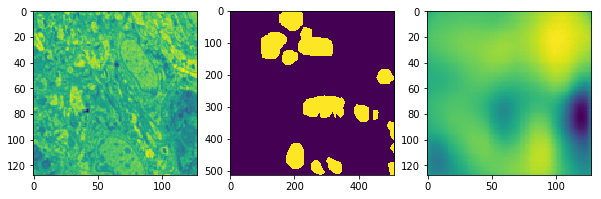

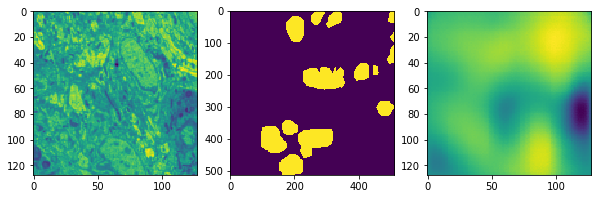

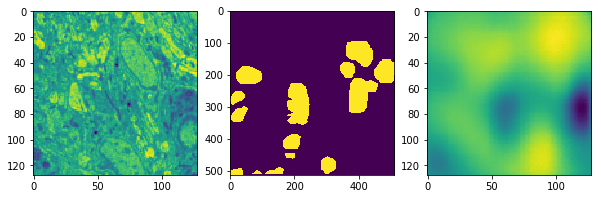

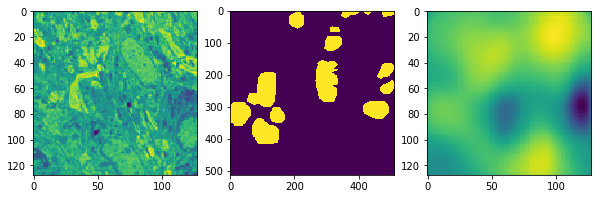

1300
Training loss:  0.4817396
(4, 128, 128, 1)
Validation loss:  0.27279347


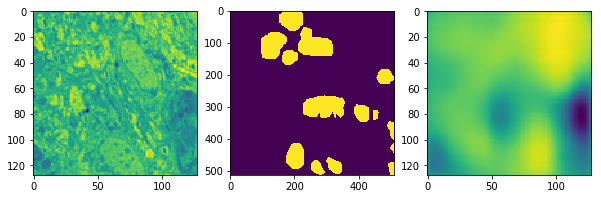

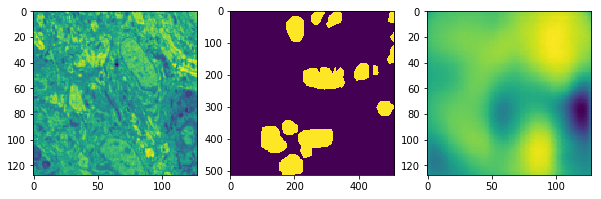

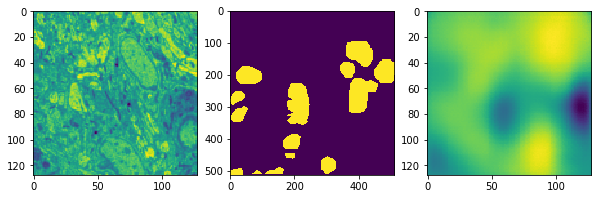

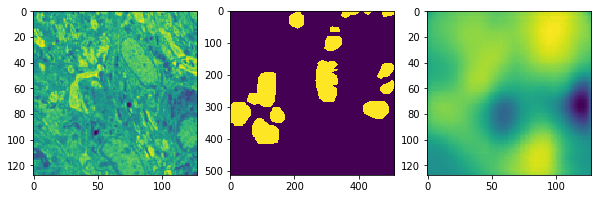

1400
Training loss:  0.43842652
(4, 128, 128, 1)
Validation loss:  0.2710455


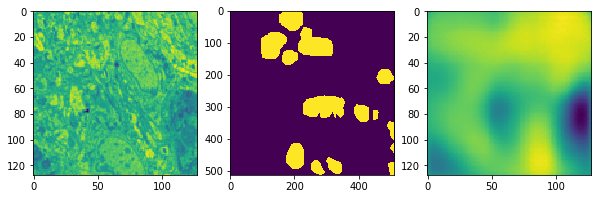

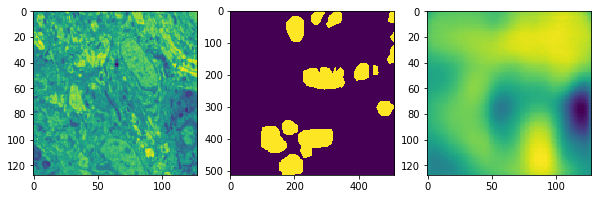

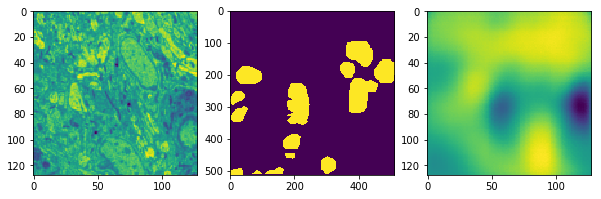

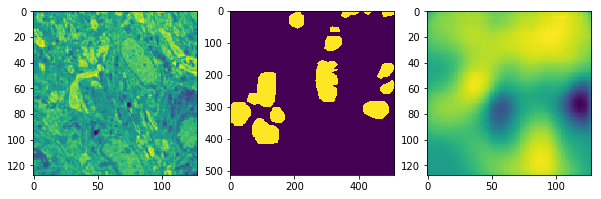

1500
Training loss:  0.44398844
(4, 128, 128, 1)
Validation loss:  0.2715853


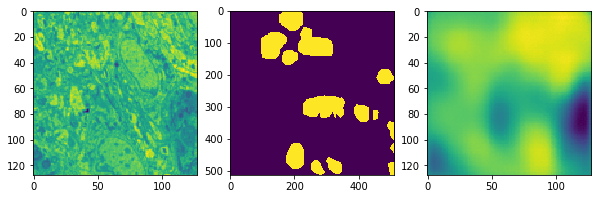

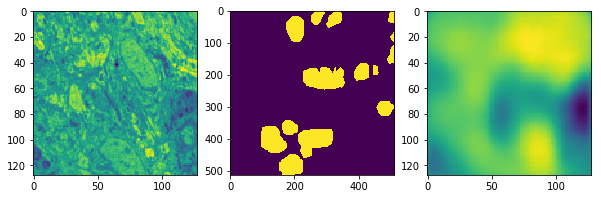

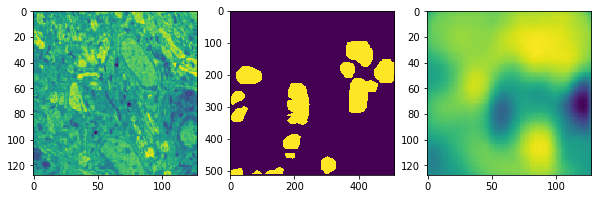

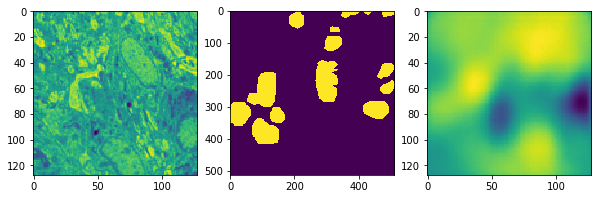

1600
Training loss:  0.41888145
(4, 128, 128, 1)
Validation loss:  0.27290422


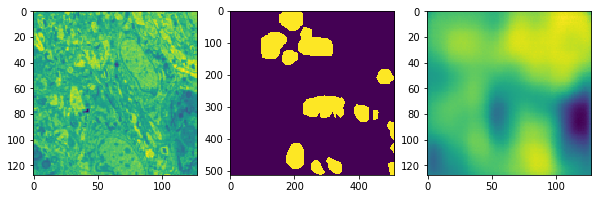

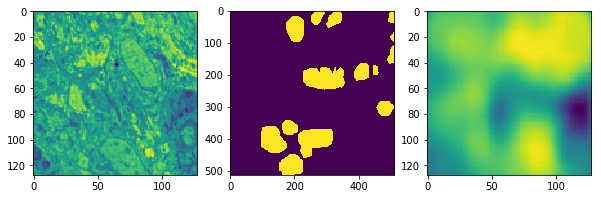

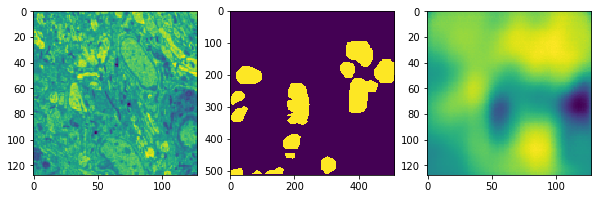

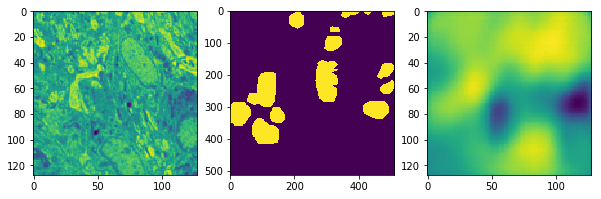

1700
Training loss:  0.38657716
(4, 128, 128, 1)
Validation loss:  0.26856342


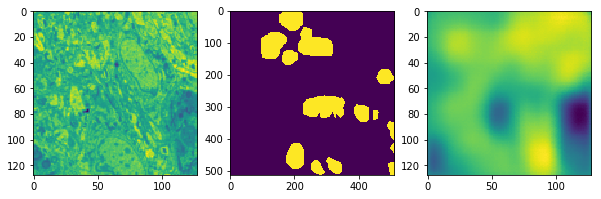

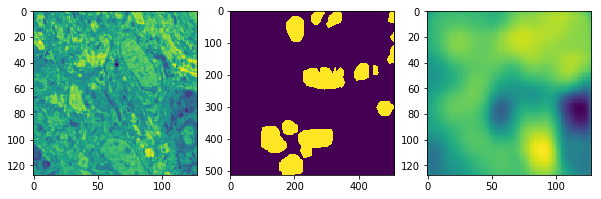

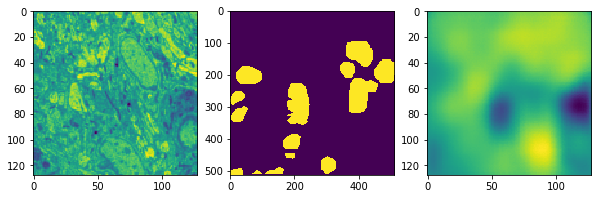

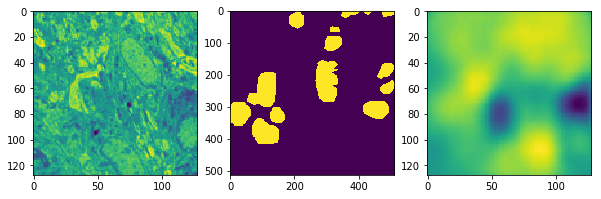

1800
Training loss:  0.39944232
(4, 128, 128, 1)
Validation loss:  0.2711482


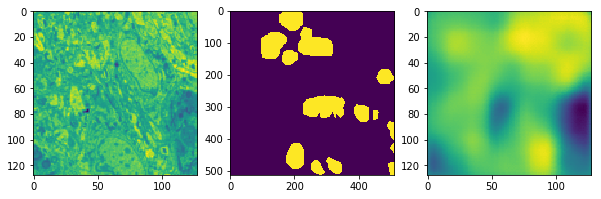

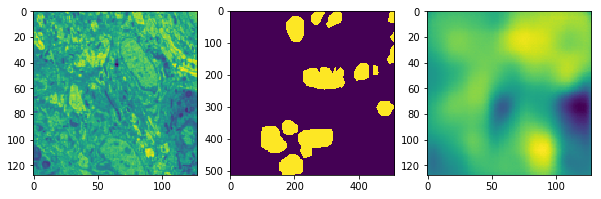

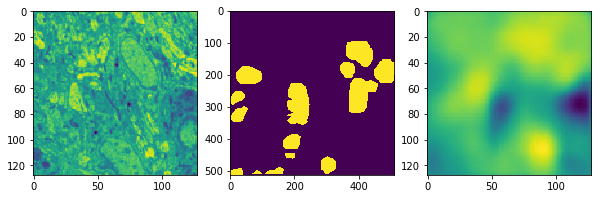

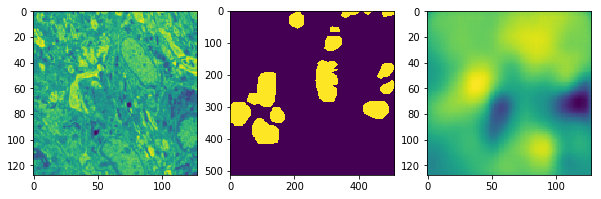

1900
Training loss:  0.4193712
(4, 128, 128, 1)
Validation loss:  0.27078927


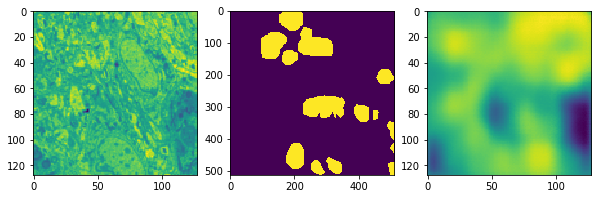

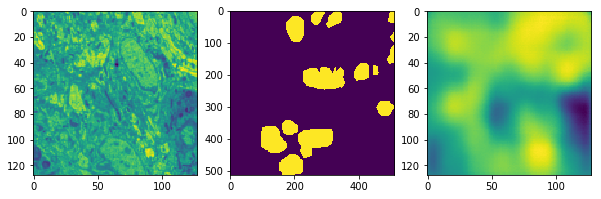

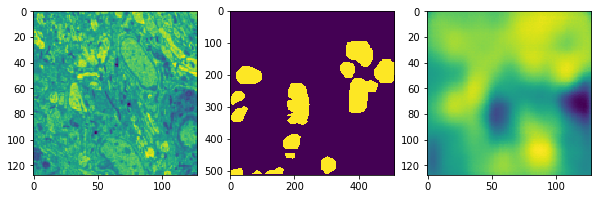

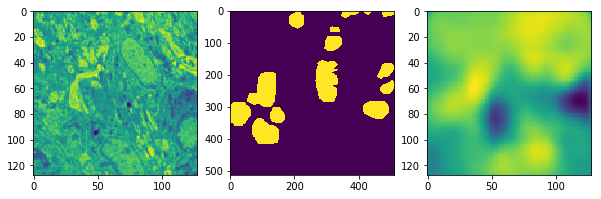

2000
Training loss:  0.35628757
(4, 128, 128, 1)
Validation loss:  0.2727248


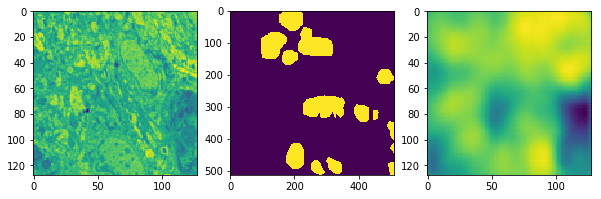

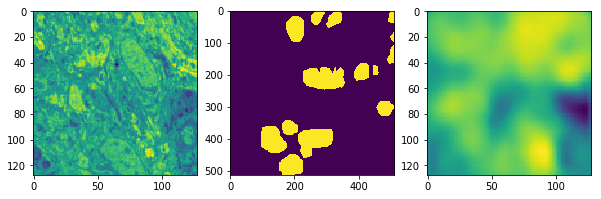

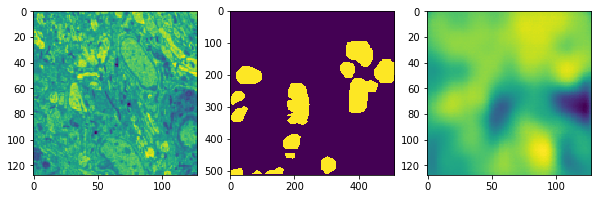

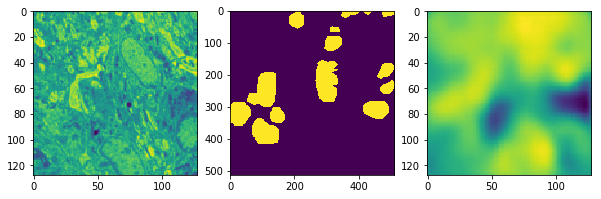

2100
Training loss:  0.3907668
(4, 128, 128, 1)
Validation loss:  0.27496848


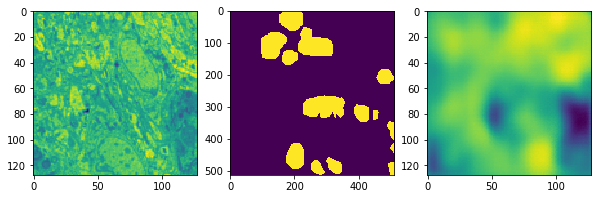

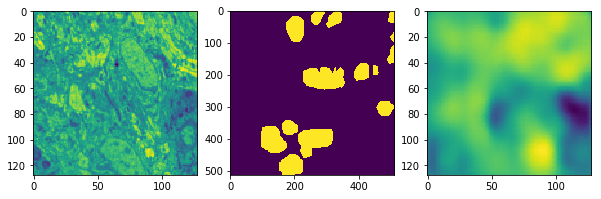

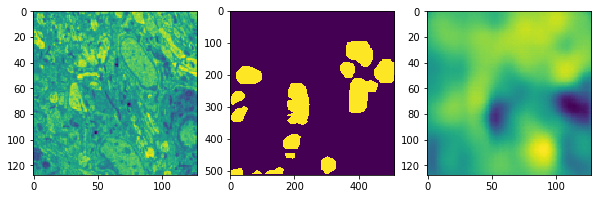

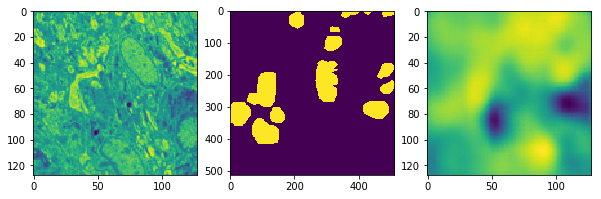

2200
Training loss:  0.37617928
(4, 128, 128, 1)
Validation loss:  0.28073418


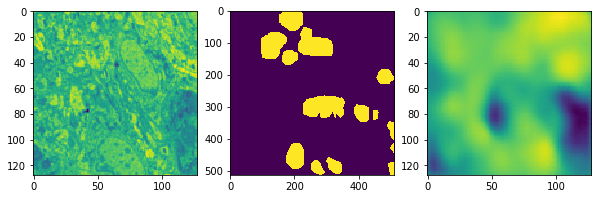

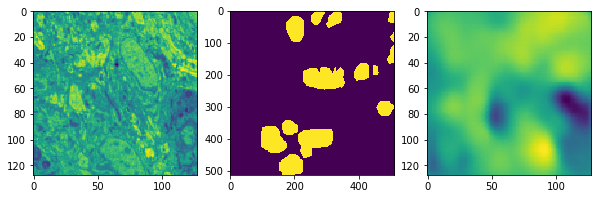

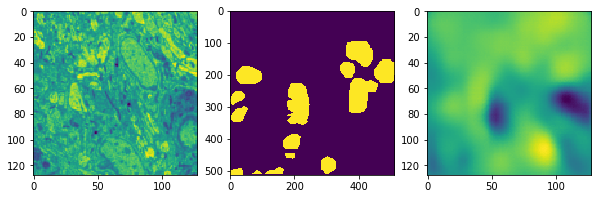

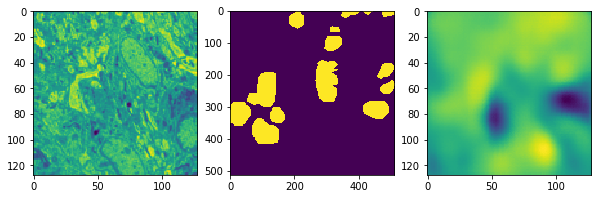

2300
Training loss:  0.33460128
(4, 128, 128, 1)
Validation loss:  0.26892775


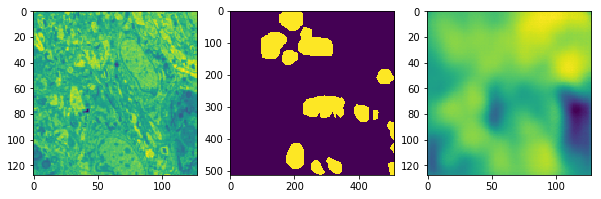

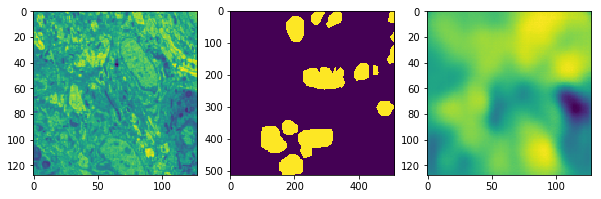

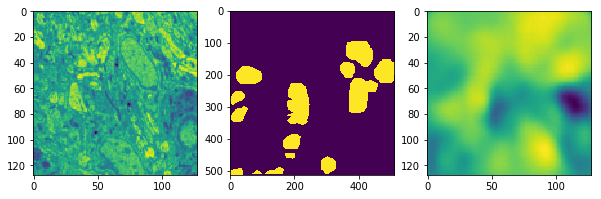

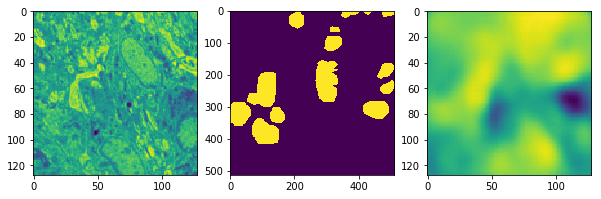

2400
Training loss:  0.37523094
(4, 128, 128, 1)
Validation loss:  0.26828223


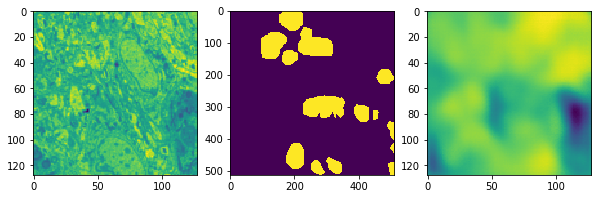

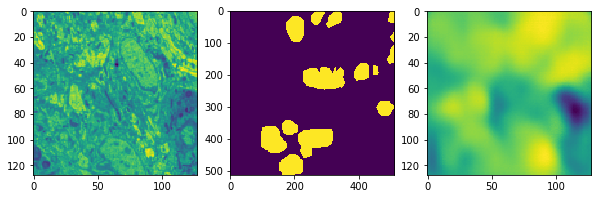

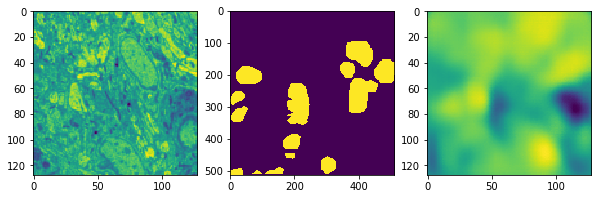

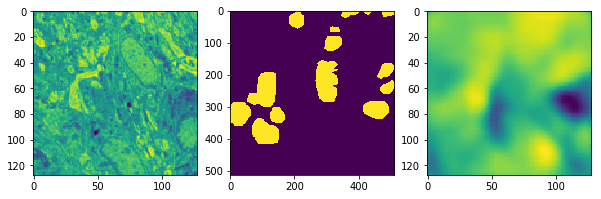

2500
Training loss:  0.36961445
(4, 128, 128, 1)
Validation loss:  0.27985835


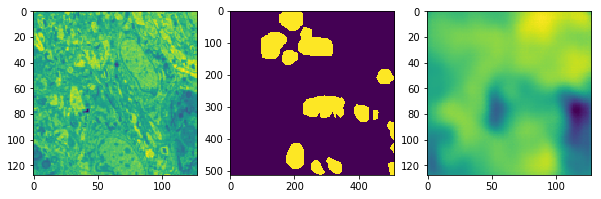

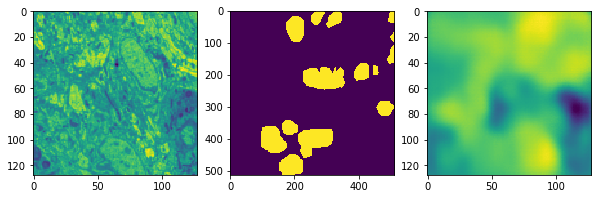

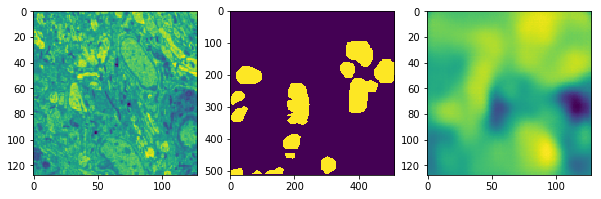

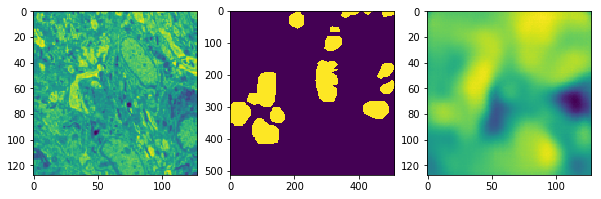

In [ ]:
tf.set_random_seed(123456)
sess=tf.Session()
sess.run(tf.global_variables_initializer())
saver = tf.train.Saver(max_to_keep=5)
#train_writer = tf.summary.FileWriter('./logs/1/train ', sess.graph)
test_writer = tf.summary.FileWriter('./logs/13/test ')


learning_rates=[0.00005, 0.00004, 0.00005, 0.00005]
learning_rate_steps=[500,1500, 2200, 7200]
current_step=0
for lrate, lrs in zip(learning_rates, learning_rate_steps):
    for i in range(current_step, lrs):
        idx=np.random.choice(train_data.shape[0], replace=False, size=[25])
        cur_train=train_data[idx,:,:,:]
        _, results, losses=sess.run([train_op,  probs, loss], feed_dict={x:cur_train, y:cur_train, lr:lrate})
        #train_writer.add_summary(summary, i)
        if (i%100==0):
            print(i)
            print("Training loss: ",losses)
            #idx=np.random.choice(validation_data.shape[0], replace=False, size=[50])
            idx=range(0,4, 1)
            sub_validation_data=validation[idx, :,:,:]
            summary, results, losses, a,c,cc=sess.run([merge, probs, loss, A1,C2,CC2], feed_dict={x:sub_validation_data, y:sub_validation_data})
            test_writer.add_summary(summary, i)
            print(results.shape)
            print("Validation loss: ",losses)
            for ti in range (0,4):
                utils.plot_3x1(sub_validation_data[ti,:,:,0], sub_validation_truth[ti,:,:,0], results[ti,:,:,0])
                plt.show()
            #saver.save(sess, data+'NewModels/Model'+str(i))
    current_step=lrs

# Process new datafiles using trained network

Load the network that works best

In [4]:
saver = tf.train.Saver()
sess=tf.Session()
sess.run(tf.global_variables_initializer())

data_model=data+'NewModels/Model1200'
saver.restore(sess,data_model)

INFO:tensorflow:Restoring parameters from /home/ubuntu/Data/NewModels/Model1200


Function for processing a file

In [9]:
print([mean, std])

[0.6918361, 0.07028653]


In [5]:
def process_file(sess, file_name):
    file_data=utils.get_raw_float_image(file_name, [1,512,512,1])
    file_data=np.reshape(file_data, [file_data.shape[0], 512, 512, 1])
    true_test2_data=file_data[:,:,:,[0]]/334328.0
    true_test2_truth=file_data[:,:,:,[0]]
    true_test2_truth[:,:,:,0]=true_test2_truth[:,:,:,0]/334328.0
    file_data=0
    print(np.std(true_test2_data))
    print(np.mean(true_test2_data))
    
    #true_test2_data=true_test2_data/np.std(true_test2_data)*0.02
    #true_test2_data=true_test2_data-np.mean(true_test2_data)+0.55
    true_test2_data=(true_test2_data-.6918361)/.07028653+0.5

    print(np.std(true_test2_data))
    print(np.mean(true_test2_data))
    
    
    num_images=true_test2_data.shape[0]
    output=np.zeros([num_images,512,512,2])
    process_batch_size=20
    print('Starting')
    for t in range(0,num_images,process_batch_size):
        endrng=np.min((t+process_batch_size,num_images))
        sub_validation_data=true_test2_data[t:(t+process_batch_size), :,:,:]
        sub_validation_truth=true_test2_truth[t:(t+process_batch_size), :,:]
        results, losses, a=sess.run([probs, loss, A1], feed_dict={x:sub_validation_data, y:sub_validation_truth})
        output[t:(t+process_batch_size),:,:,0]=sub_validation_data[:,:,:,0]
        output[t:(t+process_batch_size),:,:,1]=results[:,:,:,0]
    print('Done')
    true_test2_data=0
    true_test2_truth=0
    output=np.swapaxes(np.swapaxes(output,3,2),2,1)
    np.place(output, output<0, 0)
    (output*255.0).astype(np.uint8).tofile(file_name[0:-4]+'_output.raw')
    print(file_name[0:-4]+'_output.raw')
    return output


In [6]:
output=process_file(sess,data+'A.raw')

0.06906407
0.7109616
0.98261213
0.7721068
Starting
Done


MemoryError: 

In [14]:
output.shape

(289, 512, 512, 2)

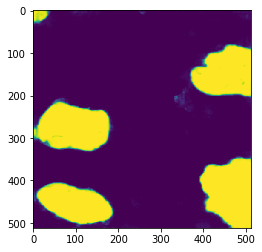

In [22]:
plt.imshow(output[10,:,:,1])